In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

import skimage.io as io
from skimage import util

from glob import glob
import trackpy

import ast
from ipywidgets import interact, widgets


# import code from the src
### import code from src folder
import sys
sys.path.append('../src/')
import chow_test_v
import area_analysis

import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error


## Read data

In [3]:
file_list=glob("../data/*_Dark_prepared.tif")
images_dict={}
for file_name in file_list:
    images_prepared=io.imread(file_name)
    file_prefix=os.path.split(file_name)[1].split('.')[0].split("_prepared")[0]
    
    binary_file=file_name.split(".tif")[0]+'_segmented'+'.tif'
    images_binary=io.imread(binary_file)
    tracks=pd.read_csv("../data/tracks_overlay_id_"+file_prefix+'.csv')
    tracks_big=pd.read_csv("../data/tracks_overlay_id_"+file_prefix+'_big.csv')
    img_dict={"img":images_prepared,"binary":images_binary,"tracks":tracks,"tracks_big":tracks_big}
    
    images_dict[file_prefix]=img_dict

## Area

* The objects have dynamic behavior. The area measurements are fluctuate with a time. My try to divide objects on subunits does not work  (geometry method, local-maximum method) . 
* Area are generally grow in two ways: linear growth of the object itself (linearly?) and aggregation.


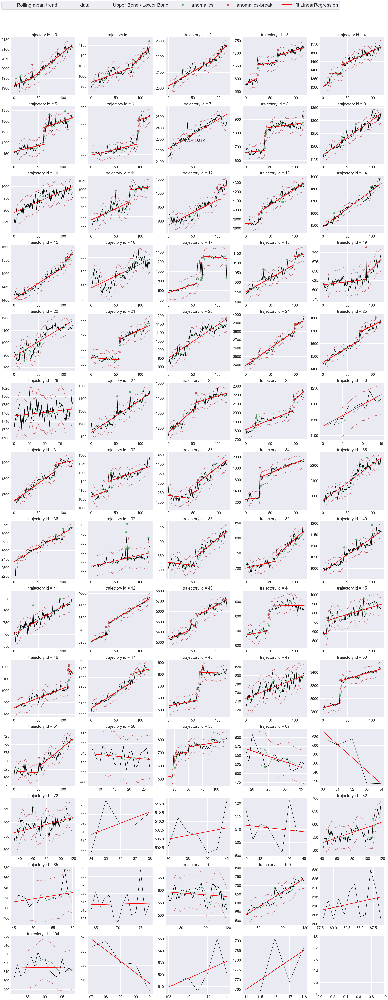

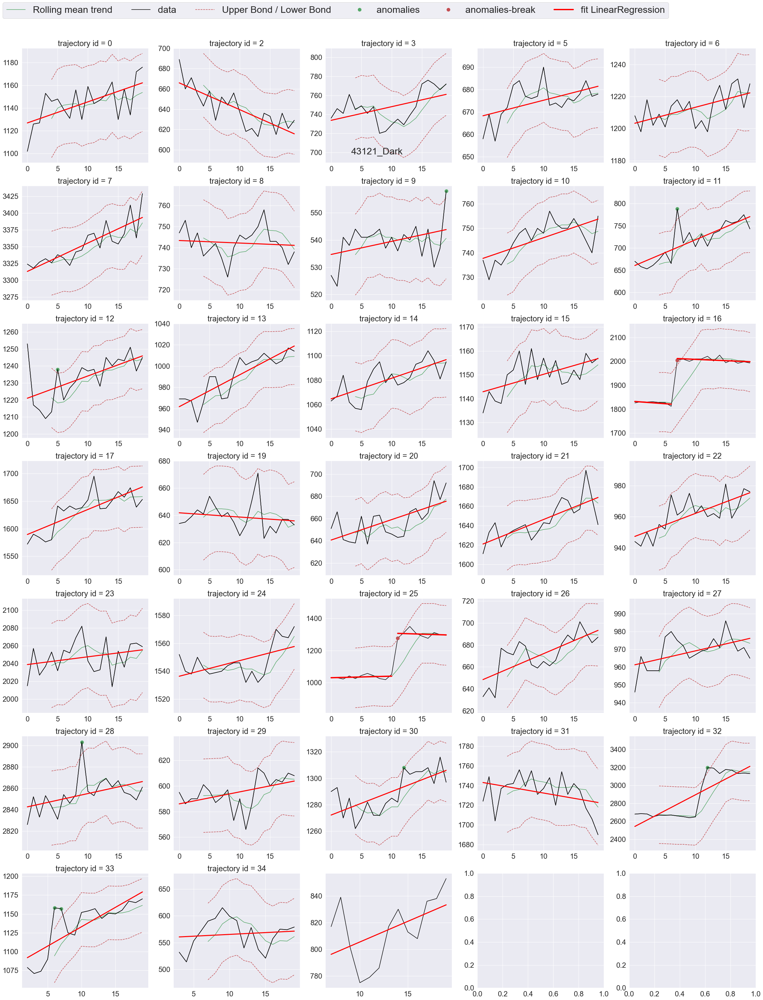

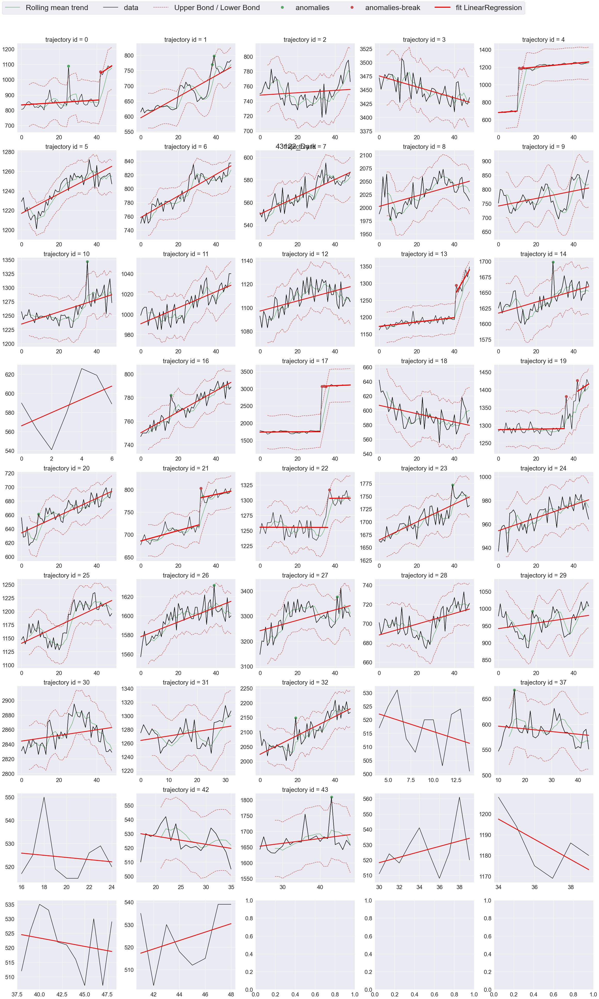

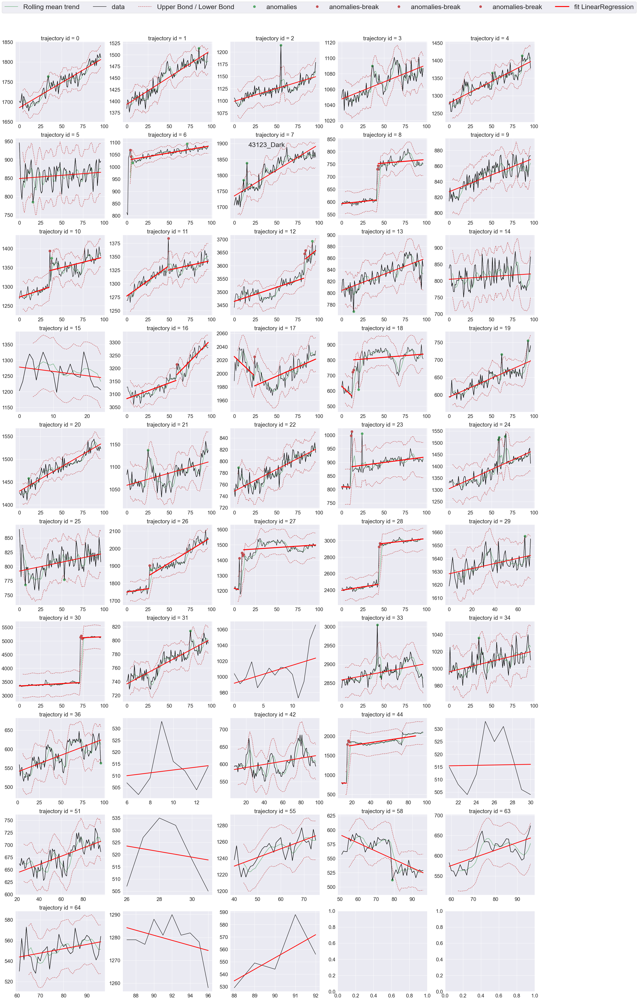

In [4]:
Area_replicas=pd.DataFrame()

for file_prefix in images_dict.keys():
    tracks=images_dict[file_prefix]["tracks_big"]
    images=images_dict[file_prefix]["img"]
    binary=images_dict[file_prefix]["binary"]

    # set up grid for plt plot
    sns.set(font_scale=2)
    Ngroups=tracks.groupby('particle').ngroups
    Nrows=np.int(np.ceil(Ngroups/5))
    fig,ax=plt.subplots(nrows=Nrows,ncols=5,figsize=(40,Nrows*7.5))
    axx=ax.ravel()

    
    #analyse each trajectory separately
    # 1) anomaly detection
    # 2) chow test anomalies
    # 3) fit according anomalies detection
    counter=0
    Area_file_prefix=pd.DataFrame()
    
    for id, traj in tracks.groupby('particle'):
        df_result=area_analysis.area_analysis(traj,axx[counter])
        Area_file_prefix=pd.concat([Area_file_prefix,df_result])
        
        if df_result.shape[0]==2:
            handles, labels = axx[counter].get_legend_handles_labels()
        counter=counter+1
        
    fig.suptitle(file_prefix,x=0.5, y=0.80)
    fig.legend(handles[:-1], labels[:-1],ncol=len(labels),loc='lower left',bbox_to_anchor=(0.1,0.90),fontsize="large")

              
    Area_file_prefix["file_prefix"]=file_prefix
    fig.savefig("../results/Area_updated_fit__{}.png".format(file_prefix))
    
    Area_replicas=pd.concat([Area_replicas,Area_file_prefix])
    

## Barplots

### Area

In [19]:
Area_replicas=Area_replicas[Area_replicas['len']>15]

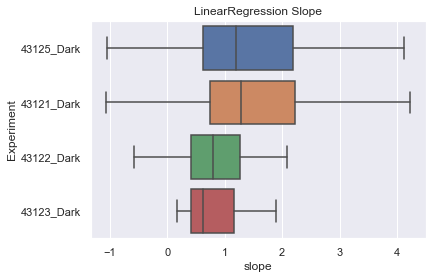

In [20]:
sns.set(font_scale=1)
ax = sns.boxplot(x="slope", y="file_prefix",data=Area_replicas, showfliers = False)
ax.set_ylabel("Experiment");
ax.set_title("LinearRegression Slope");

In [21]:
quantile_25=lambda x: np.quantile(x, 0.25)
quantile_75=lambda x: np.quantile(x, 0.75)
table= pd.pivot_table(Area_replicas, values='slope',index=['file_prefix'], aggfunc={'median',quantile_25,quantile_75}) 
table=table.rename(columns={'<lambda_0>':'25% quantile','<lambda_1>':'75% quantile' })
table=table[["median","25% quantile","75% quantile"]]
table

,median,25% quantile,75% quantile
file_prefix,,,
43121_Dark,1.276692,2.227256,0.743985
43122_Dark,0.797398,1.263010,0.419337
43123_Dark,0.627298,1.166823,0.412558
43125_Dark,1.188831,2.194574,0.620694


### MAE

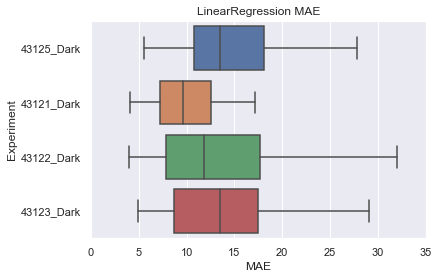

In [48]:
sns.set(font_scale=1)
ax = sns.boxplot(x="MAE", y="file_prefix",data=Area_replicas, showfliers = False)
ax.set_ylabel("Experiment");
ax.set_title("LinearRegression MAE");
ax.set_xlim([0,35]);

In [23]:
quantile_25=lambda x: np.quantile(x, 0.25)
quantile_75=lambda x: np.quantile(x, 0.75)
table= pd.pivot_table(Area_replicas, values='MAE',index=['file_prefix'], aggfunc={'median',quantile_25,quantile_75}) 
table=table.rename(columns={'<lambda_0>':'25% quantile','<lambda_1>':'75% quantile' })
table=table[["median","25% quantile","75% quantile"]]
table

,median,25% quantile,75% quantile
file_prefix,,,
43121_Dark,9.648571,12.891673,7.279192
43122_Dark,11.854498,17.658272,7.895317
43123_Dark,13.524531,17.456520,8.727378
43125_Dark,13.549622,18.063856,10.815029


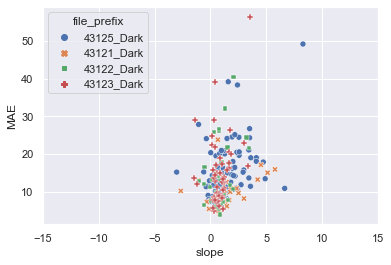

In [42]:
sns.set(font_scale=1)
ax = sns.scatterplot(x="slope",y="MAE",hue="file_prefix",style="file_prefix",data=Area_replicas)

ax.set_xlim([-15,15]);

### Length

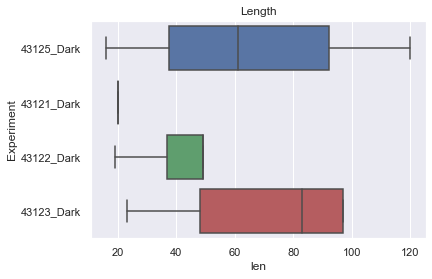

In [25]:
sns.set(font_scale=1)
ax = sns.boxplot(x="len", y="file_prefix",data=Area_replicas, showfliers = False)
ax.set_ylabel("Experiment");
ax.set_title("Length");

In [27]:
quantile_25=lambda x: np.quantile(x, 0.25)
quantile_75=lambda x: np.quantile(x, 0.75)
table= pd.pivot_table(Area_replicas, values='len',index=['file_prefix'], aggfunc={'median',quantile_25,quantile_75}) 
table=table.rename(columns={'<lambda_0>':'25% quantile','<lambda_1>':'75% quantile' })
table=table[["median","25% quantile","75% quantile"]]
table

,median,25% quantile,75% quantile
file_prefix,,,
43121_Dark,20.0,20.00,20.00
43122_Dark,49.0,36.75,49.00
43123_Dark,83.0,48.25,97.00
43125_Dark,61.0,37.50,92.25


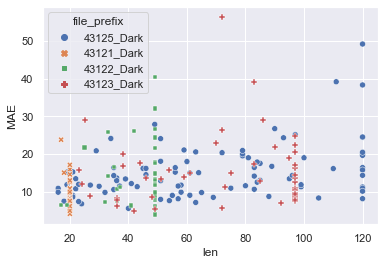

In [45]:
sns.set(font_scale=1)
ax = sns.scatterplot(x="len",y="MAE",hue="file_prefix",style="file_prefix",data=Area_replicas)

### Intersept

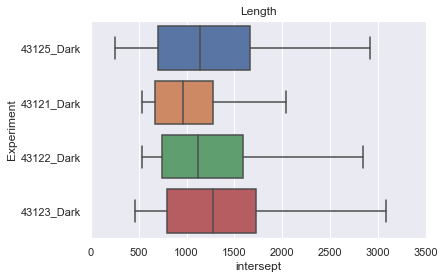

In [49]:
sns.set(font_scale=1)
ax = sns.boxplot(x="intersept", y="file_prefix",data=Area_replicas, showfliers = False)
ax.set_ylabel("Experiment");
ax.set_xlim([0,3500]);
ax.set_title("Length");

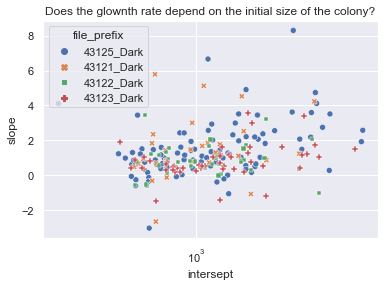

In [53]:
sns.set(font_scale=1)
ax = sns.scatterplot(y="slope",x="intersept",hue="file_prefix",style="file_prefix",data=Area_replicas)
ax.set_title("Does the glownth rate depend on the initial size of the colony?");
ax.set(xscale="log");

### PairPlot

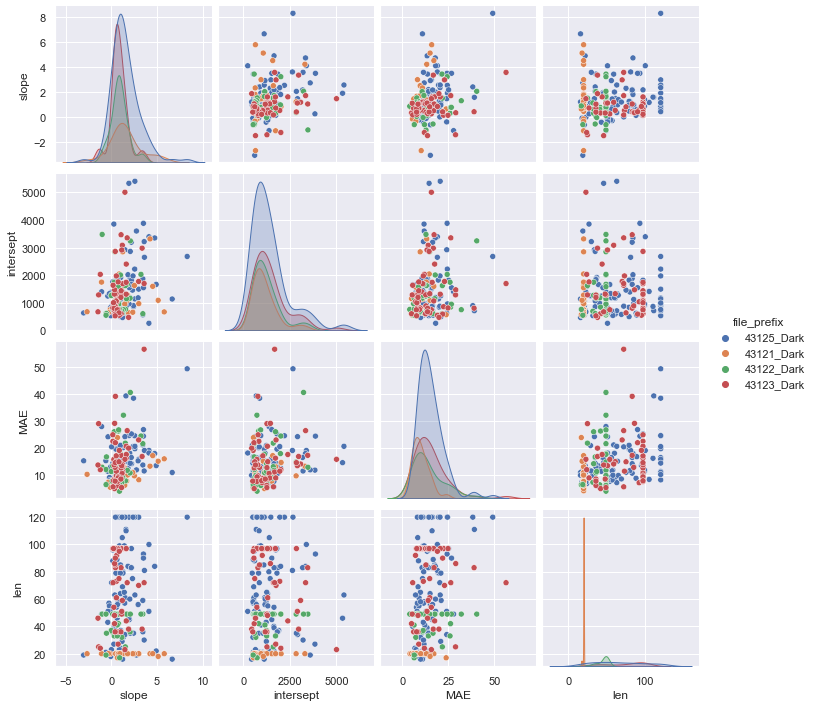

In [54]:
Area_replicas=Area_replicas[Area_replicas['slope']<30]
select=['slope', 'intersept','MAE','len','file_prefix']
sns.pairplot(data=Area_replicas[select],hue='file_prefix');